In [1]:
import pandas as pd
import numpy as np
from scipy.ndimage import zoom
import random
import matplotlib.pyplot as plt

In [2]:
df = pd.read_excel('real_rainfall.xlsx')
real_rains = [df[col].dropna().values for col in ['Value1', 'Value2', 'Value3', 'Value4']]
df.head(10)

,Time (H:M),Value1,Value2,Value3,Value4
0,00:00:00,0.19,0.01,0.01,0.01
1,00:05:00,0.39,0.01,0.00,0.00
2,00:10:00,0.23,0.00,0.01,0.00
3,00:15:00,0.33,0.01,0.01,0.01
4,00:20:00,0.05,0.01,0.02,0.01
5,00:25:00,0.04,0.00,0.02,0.00
6,00:30:00,0.01,0.00,0.01,0.03
7,00:35:00,0.00,0.00,0.02,0.01
8,00:40:00,0.01,0.01,0.02,0.04
9,00:45:00,0.00,0.01,0.01,0.03


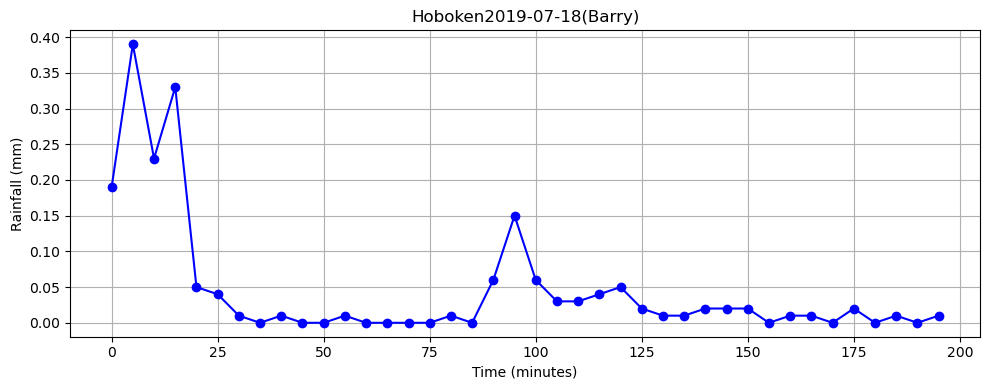

In [3]:
rain = df.iloc[:, 1].values  

time = [i * 5 for i in range(len(rain))] 

plt.figure(figsize=(10, 4))
plt.plot(time, rain, marker='o', linestyle='-', color='blue')
plt.xlabel('Time (minutes)')
plt.ylabel('Rainfall (mm)')
plt.title('Hoboken2019-07-18(Barry)')
plt.grid(True)
plt.tight_layout()
plt.show()

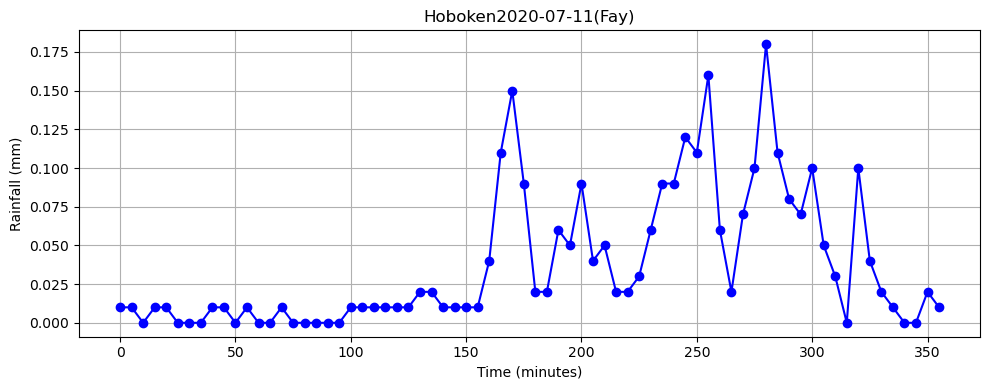

In [4]:
rain = df.iloc[:, 2].values  

time = [i * 5 for i in range(len(rain))] 

plt.figure(figsize=(10, 4))
plt.plot(time, rain, marker='o', linestyle='-', color='blue')
plt.xlabel('Time (minutes)')
plt.ylabel('Rainfall (mm)')
plt.title('Hoboken2020-07-11(Fay)')
plt.grid(True)
plt.tight_layout()
plt.show()

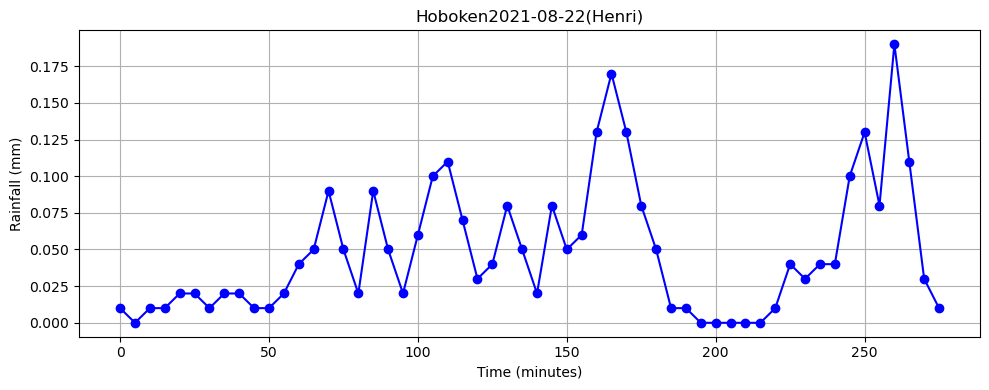

In [5]:
rain = df.iloc[:, 3].values  

time = [i * 5 for i in range(len(rain))] 

plt.figure(figsize=(10, 4))
plt.plot(time, rain, marker='o', linestyle='-', color='blue')
plt.xlabel('Time (minutes)')
plt.ylabel('Rainfall (mm)')
plt.title('Hoboken2021-08-22(Henri)')
plt.grid(True)
plt.tight_layout()
plt.show()

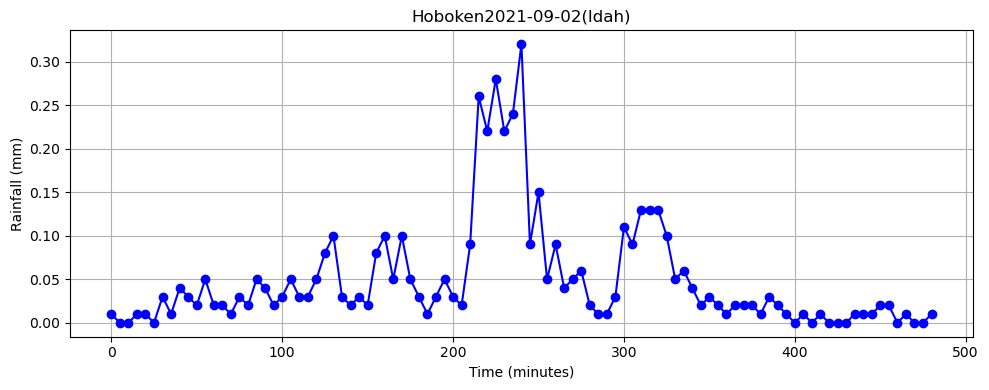

In [6]:
rain = df.iloc[:, 4].values  

time = [i * 5 for i in range(len(rain))] 

plt.figure(figsize=(10, 4))
plt.plot(time, rain, marker='o', linestyle='-', color='blue')
plt.xlabel('Time (minutes)')
plt.ylabel('Rainfall (mm)')
plt.title('Hoboken2021-09-02(Idah)')
plt.grid(True)
plt.tight_layout()
plt.show()

In [13]:
synthetic_rains = []

for real_rain in real_rains:
    for _ in range(50): 
        rain = real_rain.copy()

        rain *= np.random.uniform(0.2, 3)

        scale = np.random.uniform(0.2, 2)
        rain_scaled = zoom(rain, scale)

        shift = random.randint(-len(rain_scaled) + len(rain), len(rain))
        rain_shifted = np.roll(rain_scaled, shift)

        noise = np.random.normal(0, 0.15 * np.max(rain_shifted), len(rain_shifted))
        rain_noisy = np.maximum(0, rain_shifted + noise)

        synthetic_rains.append(rain_noisy)

max_length = max(len(r) for r in synthetic_rains)

padded_rains = [np.pad(r, (0, max_length - len(r)), mode='constant') for r in synthetic_rains]
synthetic_array = np.column_stack(padded_rains)

df_out = pd.DataFrame(synthetic_array)
df_out.to_excel('synthetic_rainfall_variable_duration.xlsx', index=False)

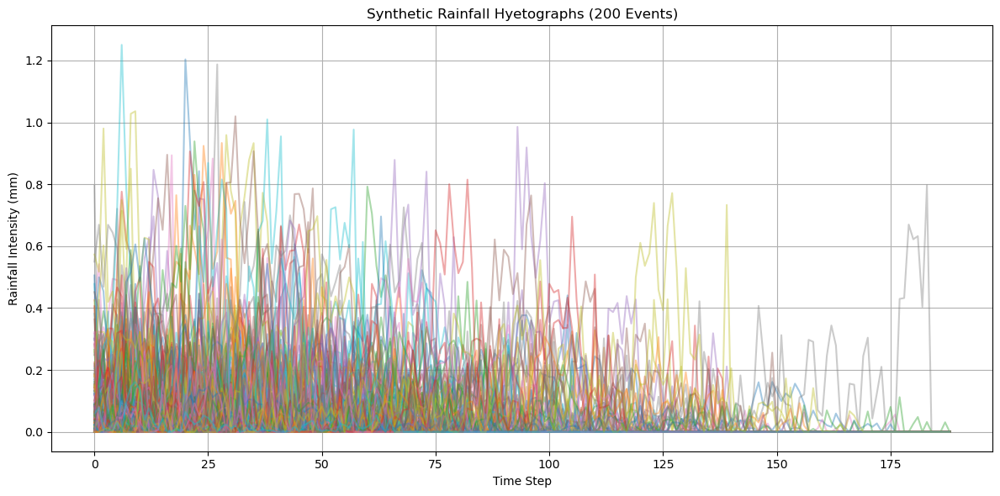

In [14]:
import matplotlib.pyplot as plt

df = pd.read_excel('synthetic_rainfall_variable_duration.xlsx')

plt.figure(figsize=(12, 6))

for col in df.columns:
    plt.plot(df.index, df[col], alpha=0.4)

plt.xlabel('Time Step')
plt.ylabel('Rainfall Intensity (mm)')
plt.title('Synthetic Rainfall Hyetographs (200 Events)')
plt.grid(True)
plt.tight_layout()
plt.show()

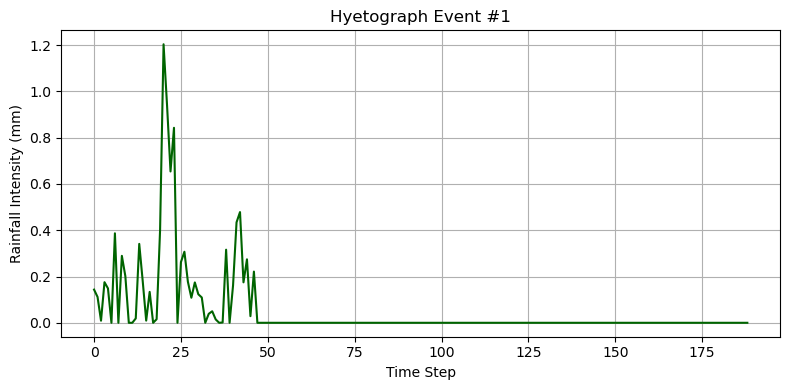

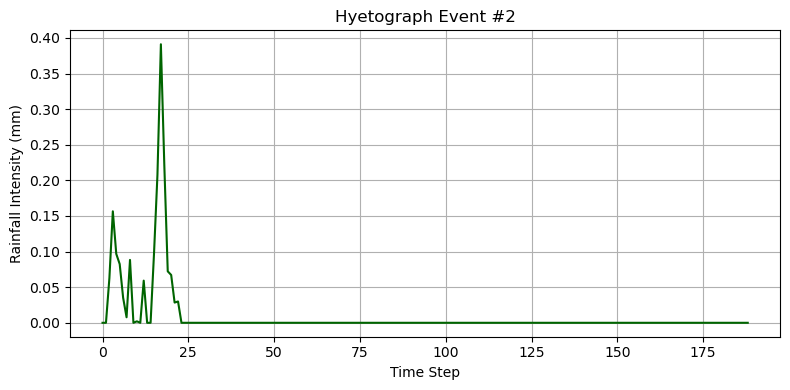

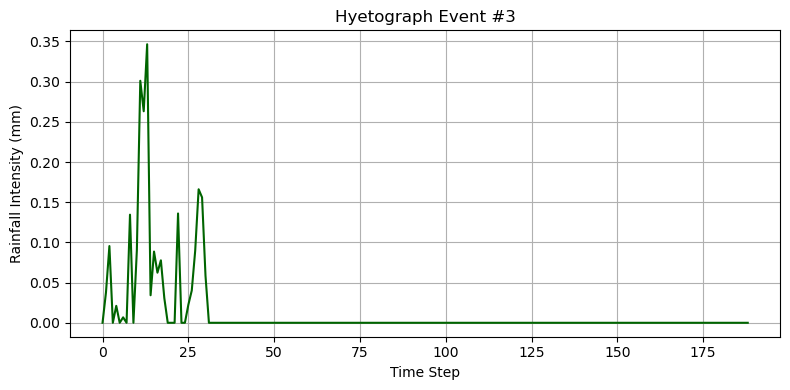

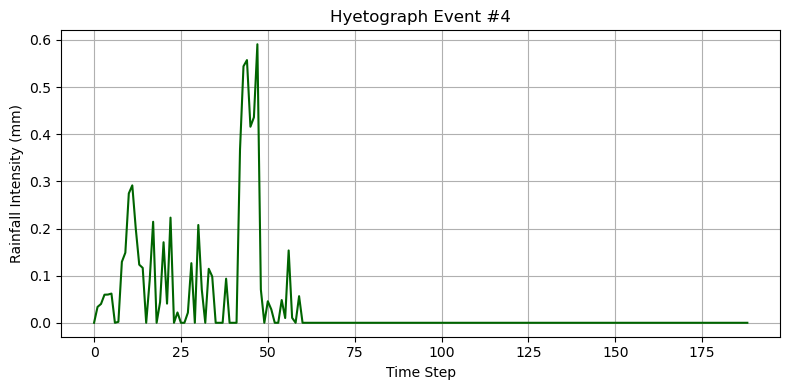

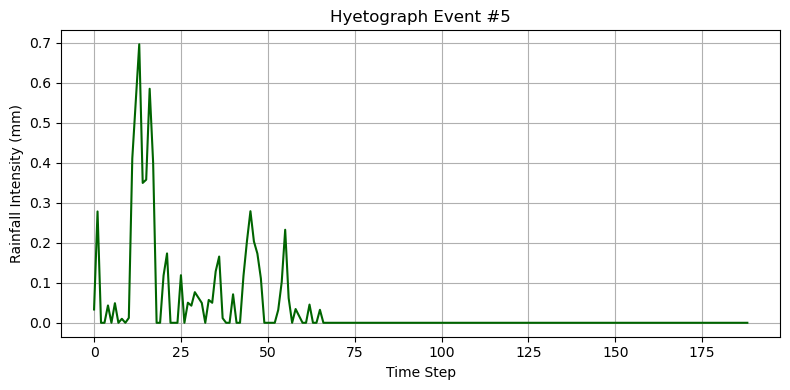

...

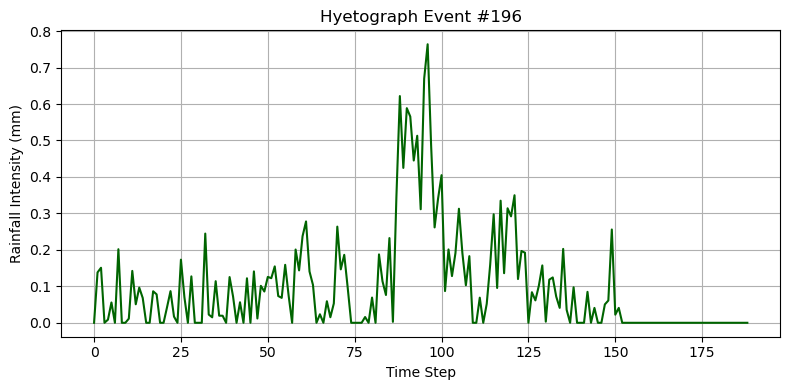

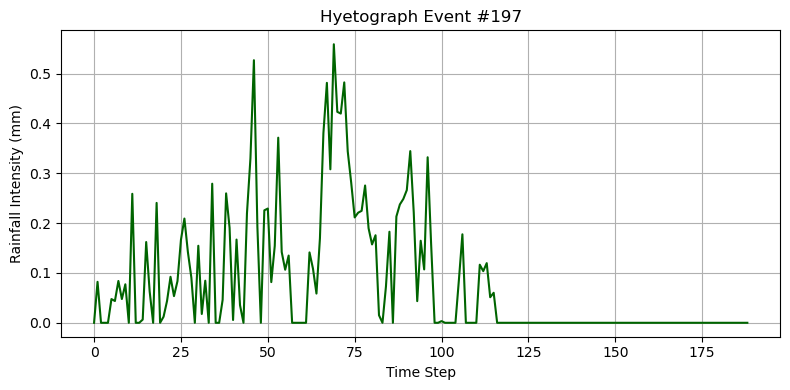

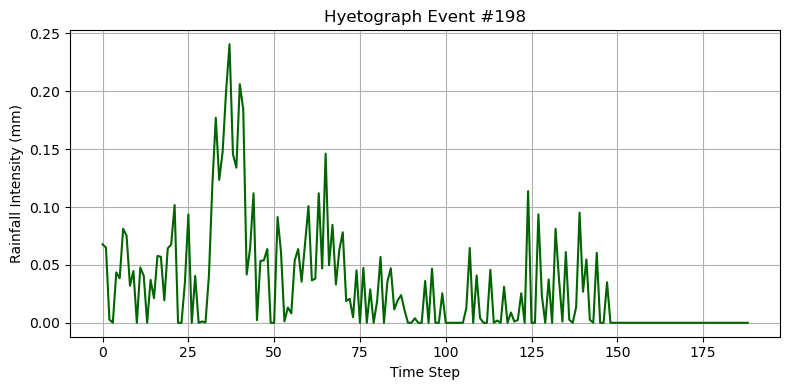

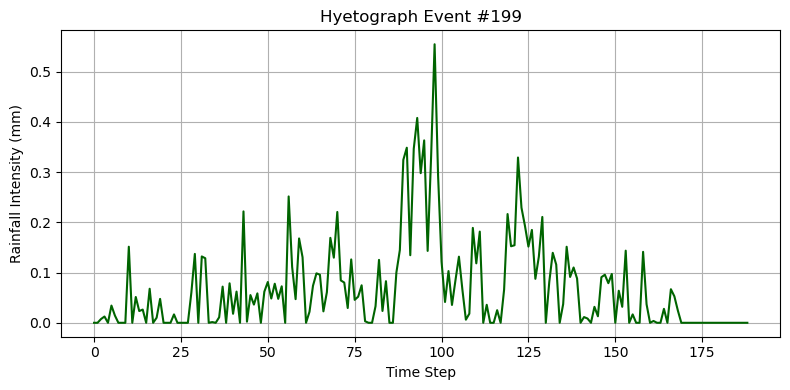

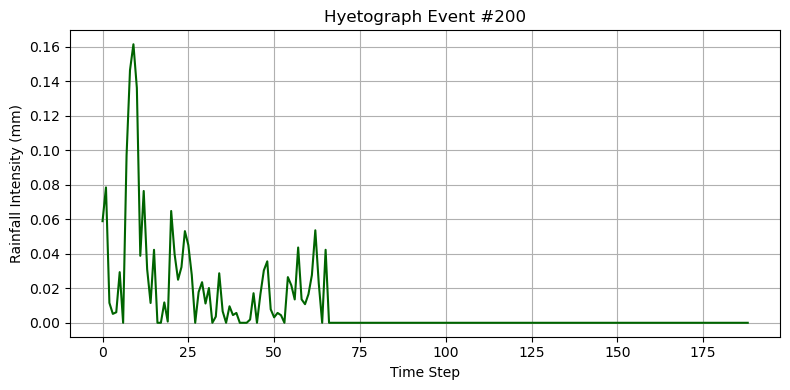

In [15]:
df = pd.read_excel('synthetic_rainfall_variable_duration.xlsx')

n_plots = 200

for i in range(n_plots):
    plt.figure(figsize=(8, 4))
    plt.plot(df.index, df.iloc[:, i], color='darkgreen')
    plt.xlabel('Time Step')
    plt.ylabel('Rainfall Intensity (mm)')
    plt.title(f'Hyetograph Event #{i+1}')
    plt.grid(True)
    plt.tight_layout()
    plt.show()